## Forecasting and Monitoring Hospitalization Trends from Respiratory Viruses in Kenya: A Time Series Analysis by County
 (Using U.S. Government Data as a Proxy)


## Business Understanding

Kenya faces challenges in tracking and predicting hospitalizations caused by respiratory viruses like COVID-19, Influenza, and RSV due to limited real-time health data. Since local data is scarce, this project uses public hospitalization records from the United States (provided by agencies like the CDC and HHS) as a reliable substitute. By analyzing these structured records, the project demonstrates how a data-driven approach could be applied in Kenya in the future. The goal is to develop a system that can forecast hospitalization trends, detect unexpected surges, and support timely public health actions. When Kenya establishes a similar data infrastructure, the insights from this study can help shape policies, allocate resources, and improve healthcare preparedness.

# Problem Statement

Kenya lacks a robust real-time health surveillance system to track and predict hospitalizations caused by respiratory viruses like COVID-19, Influenza, and RSV. The absence of structured local data makes it difficult to anticipate hospitalization trends and respond effectively to surges. By leveraging publicly available U.S. hospitalization data as a proxy, this project aims to demonstrate how a data-driven forecasting approach could be implemented in Kenya. The ultimate goal is to support timely public health interventions, optimize resource allocation, and enhance preparedness once a local data infrastructure is established.

# Objectives
  To monitor, model, and forecast respiratory virus-related hospitalization   

1.     To monitor, model, and forecast respiratory virus-related hospitalization trends across U.S. jurisdictions to support healthcare resource planning, outbreak response, and policy decisions.

2. Detect patterns and seasonality in respiratory virus hospitalizations.
3.  Forecast future hospitalization trends at the national and jurisdictional levels.
4. Evaluate the impact of interventions (vaccinations, NPIs) on hospitalization metrics.
5. Provide real-time dashboards for public health stakeholders.


## **Stakeholders**
1. CDC and local health departments
2. Hospital administrators and planners
3. Epidemiologists and public health researchers
4. Policy-makers and emergency response teams



EDA



In [ ]:
!pip install sktime

In [ ]:
#import necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import datetime

In [ ]:
# load the dataset
rvr_df = pd.read_csv("/content/RVR.csv")
rvr_df.head()

,jurisdiction,collection_date,number_hospitals_reporting_today,total_hospitals,admissions_all_covid_confirmed,admissions_70_covid_confirmed,admissions_30_49_covid_confirmed,admissions_50_69_covid_confirmed,admissions_18_29_covid_confirmed,admissions_0_17_covid_confirmed,average_admissions_all_covid_confirmed,average_admissions_18_29_covid_confirmed,average_admissions_40_49_covid_confirmed,average_admissions_60_69_covid_confirmed,average_admissions_30_49_covid_confirmed,average_admissions_50_69_covid_confirmed,average_admissions_0_17_covid_confirmed,average_admissions_70_covid_confirmed,admissions_60_69_covid_confirmed,average_admissions_60_69_covid_confirmed_per_100k,average_admissions_0_17_covid_confirmed_per_100k,average_admissions_50_59_covid_confirmed_per_100k,average_admissions_all_covid_confirmed_per_100k,average_admissions_30_39_covid_confirmed_per_100k,average_admissions_40_49_covid_confirmed_per_100k,average_admissions_70_covid_confirmed_per_100k,average_admissions_50_69_covid_confirmed_per_100k,average_admissions_30_49_covid_confirmed_per_100k,average_admissions_18_29_covid_confirmed_per_100k,total_admissions_all_covid_confirmed_past_7days_per_100k,percent_change_total_admissions_all_covid_confirmed_past_7days_per_100k,total_patients_hospitalized_covid_confirmed,average_total_patients_hospitalized_covid_confirmed,total_adult_patients_hospitalized_covid_confirmed,total_pediatric_patients_hospitalized_covid_confirmed,inpatient_beds,average_inpatient_beds,inpatient_adult_beds,inpatient_pediatric_beds,inpatient_beds_used,average_inpatient_beds_occupied,inpatient_adult_beds_used,inpatient_pediatric_beds_used,total_icu_beds,total_staffed_adult_icu_beds,total_staffed_pediatric_icu_beds,staff_icu_adult_patients_covid_confirmed,staff_icu_pediatric_patients_covid_confirmed,icu_beds_used,staff_adult_icu_beds_occupied,staff_pediatric_icu_beds_occupied,staff_icu_patients_covid_confirmed,percent_inpatient_beds_occupied,percent_adult_inpatient_beds_occupied,percent_pediatric_inpatient_beds_occupied,percent_inpatient_beds_covid,percent_adult_inpatient_beds_covid,percent_pediatric_inpatient_beds_covid,percent_staff_icu_beds_occupied,percent_staff_adult_icu_beds_occupied,percent_staff_pediatric_icu_beds_occupied,percent_staff_icu_beds_covid,percent_staff_adult_icu_beds_covid,percent_staff_pediatric_icu_beds_covid,average_percent_inpatient_beds_occupied,absolute_change_average_percent_inpatient_beds_occupied,average_percent_adult_inpatient_beds_occupied,average_percent_pediatric_inpatient_beds_occupied,average_percent_inpatient_beds_covid,average_percent_adult_inpatient_beds_covid,average_percent_pediatric_inpatient_beds_covid,average_percent_staff_icu_beds_occupied,absolute_change_average_percent_staff_icu_beds_occupied,average_percent_staff_adult_icu_beds_occupied,average_percent_staff_pediatric_icu_beds_occupied,average_percent_staff_icu_beds_covid,average_percent_staff_adult_icu_beds_covid,average_percent_staff_pediatric_icu_beds_covid,total_admissions_all_covid_confirmed_past_7days,percent_change_total_admissions_all_covid_confirmed_past_7days,absolute_change_average_percent_inpatient_beds_covid,absolute_change_average_percent_staff_icu_beds_covid,total_admissions_all_influenza_confirmed_past_7days,percent_change_total_admissions_all_influenza_confirmed_past_7days,total_admissions_all_influenza_confirmed_past_7days_per_100k,percent_change_total_admissions_all_influenza_confirmed_past_7days_per_100k,total_patients_hospitalized_influenza_confirmed,percent_inpatient_beds_influenza,average_percent_inpatient_beds_influenza,absolute_change_average_percent_inpatient_beds_influenza,icu_patients_influenza_confirmed,percent_staff_icu_beds_influenza,average_percent_staff_icu_beds_influenza,absolute_change_average_percent_staff_icu_beds_influenza,absolute_change_average_percent_adult_inpatient_beds_occupied,absolute_change_average_percent_pediatric_inpatient_beds_occupied,absolute_change_average_percent_staff_adult_icu_beds_occupied,absolute_

In [ ]:
rvr_df.tail()

,jurisdiction,collection_date,number_hospitals_reporting_today,total_hospitals,admissions_all_covid_confirmed,admissions_70_covid_confirmed,admissions_30_49_covid_confirmed,admissions_50_69_covid_confirmed,admissions_18_29_covid_confirmed,admissions_0_17_covid_confirmed,average_admissions_all_covid_confirmed,average_admissions_18_29_covid_confirmed,average_admissions_40_49_covid_confirmed,average_admissions_60_69_covid_confirmed,average_admissions_30_49_covid_confirmed,average_admissions_50_69_covid_confirmed,average_admissions_0_17_covid_confirmed,average_admissions_70_covid_confirmed,admissions_60_69_covid_confirmed,average_admissions_60_69_covid_confirmed_per_100k,average_admissions_0_17_covid_confirmed_per_100k,average_admissions_50_59_covid_confirmed_per_100k,average_admissions_all_covid_confirmed_per_100k,average_admissions_30_39_covid_confirmed_per_100k,average_admissions_40_49_covid_confirmed_per_100k,average_admissions_70_covid_confirmed_per_100k,average_admissions_50_69_covid_confirmed_per_100k,average_admissions_30_49_covid_confirmed_per_100k,average_admissions_18_29_covid_confirmed_per_100k,total_admissions_all_covid_confirmed_past_7days_per_100k,percent_change_total_admissions_all_covid_confirmed_past_7days_per_100k,total_patients_hospitalized_covid_confirmed,average_total_patients_hospitalized_covid_confirmed,total_adult_patients_hospitalized_covid_confirmed,total_pediatric_patients_hospitalized_covid_confirmed,inpatient_beds,average_inpatient_beds,inpatient_adult_beds,inpatient_pediatric_beds,inpatient_beds_used,average_inpatient_beds_occupied,inpatient_adult_beds_used,inpatient_pediatric_beds_used,total_icu_beds,total_staffed_adult_icu_beds,total_staffed_pediatric_icu_beds,staff_icu_adult_patients_covid_confirmed,staff_icu_pediatric_patients_covid_confirmed,icu_beds_used,staff_adult_icu_beds_occupied,staff_pediatric_icu_beds_occupied,staff_icu_patients_covid_confirmed,percent_inpatient_beds_occupied,percent_adult_inpatient_beds_occupied,percent_pediatric_inpatient_beds_occupied,percent_inpatient_beds_covid,percent_adult_inpatient_beds_covid,percent_pediatric_inpatient_beds_covid,percent_staff_icu_beds_occupied,percent_staff_adult_icu_beds_occupied,percent_staff_pediatric_icu_beds_occupied,percent_staff_icu_beds_covid,percent_staff_adult_icu_beds_covid,percent_staff_pediatric_icu_beds_covid,average_percent_inpatient_beds_occupied,absolute_change_average_percent_inpatient_beds_occupied,average_percent_adult_inpatient_beds_occupied,average_percent_pediatric_inpatient_beds_occupied,average_percent_inpatient_beds_covid,average_percent_adult_inpatient_beds_covid,average_percent_pediatric_inpatient_beds_covid,average_percent_staff_icu_beds_occupied,absolute_change_average_percent_staff_icu_beds_occupied,average_percent_staff_adult_icu_beds_occupied,average_percent_staff_pediatric_icu_beds_occupied,average_percent_staff_icu_beds_covid,average_percent_staff_adult_icu_beds_covid,average_percent_staff_pediatric_icu_beds_covid,total_admissions_all_covid_confirmed_past_7days,percent_change_total_admissions_all_covid_confirmed_past_7days,absolute_change_average_percent_inpatient_beds_covid,absolute_change_average_percent_staff_icu_beds_covid,total_admissions_all_influenza_confirmed_past_7days,percent_change_total_admissions_all_influenza_confirmed_past_7days,total_admissions_all_influenza_confirmed_past_7days_per_100k,percent_change_total_admissions_all_influenza_confirmed_past_7days_per_100k,total_patients_hospitalized_influenza_confirmed,percent_inpatient_beds_influenza,average_percent_inpatient_beds_influenza,absolute_change_average_percent_inpatient_beds_influenza,icu_patients_influenza_confirmed,percent_staff_icu_beds_influenza,average_percent_staff_icu_beds_influenza,absolute_change_average_percent_staff_icu_beds_influenza,absolute_change_average_percent_adult_inpatient_beds_occupied,absolute_change_average_percent_pediatric_inpatient_beds_occupied,absolute_change_average_percent_staff_adult_icu_beds_occupied,absolute_

In [ ]:
print(rvr_df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50259 entries, 0 to 50258
Columns: 107 entries, jurisdiction to average_admissions_12_17_covid_confirmed_per_100k
dtypes: float64(105), object(2)
memory usage: 41.0+ MB
None


In [ ]:
rvr_df.describe()

,number_hospitals_reporting_today,total_hospitals,admissions_all_covid_confirmed,admissions_70_covid_confirmed,admissions_30_49_covid_confirmed,admissions_50_69_covid_confirmed,admissions_18_29_covid_confirmed,admissions_0_17_covid_confirmed,average_admissions_all_covid_confirmed,average_admissions_18_29_covid_confirmed,average_admissions_40_49_covid_confirmed,average_admissions_60_69_covid_confirmed,average_admissions_30_49_covid_confirmed,average_admissions_50_69_covid_confirmed,average_admissions_0_17_covid_confirmed,average_admissions_70_covid_confirmed,admissions_60_69_covid_confirmed,average_admissions_60_69_covid_confirmed_per_100k,average_admissions_0_17_covid_confirmed_per_100k,average_admissions_50_59_covid_confirmed_per_100k,average_admissions_all_covid_confirmed_per_100k,average_admissions_30_39_covid_confirmed_per_100k,average_admissions_40_49_covid_confirmed_per_100k,average_admissions_70_covid_confirmed_per_100k,average_admissions_50_69_covid_confirmed_per_100k,average_admissions_30_49_covid_confirmed_per_100k,average_admissions_18_29_covid_confirmed_per_100k,total_admissions_all_covid_confirmed_past_7days_per_100k,percent_change_total_admissions_all_covid_confirmed_past_7days_per_100k,total_patients_hospitalized_covid_confirmed,average_total_patients_hospitalized_covid_confirmed,total_adult_patients_hospitalized_covid_confirmed,total_pediatric_patients_hospitalized_covid_confirmed,inpatient_beds,average_inpatient_beds,inpatient_adult_beds,inpatient_pediatric_beds,inpatient_beds_used,average_inpatient_beds_occupied,inpatient_adult_beds_used,inpatient_pediatric_beds_used,total_icu_beds,total_staffed_adult_icu_beds,total_staffed_pediatric_icu_beds,staff_icu_adult_patients_covid_confirmed,staff_icu_pediatric_patients_covid_confirmed,icu_beds_used,staff_adult_icu_beds_occupied,staff_pediatric_icu_beds_occupied,staff_icu_patients_covid_confirmed,percent_inpatient_beds_occupied,percent_adult_inpatient_beds_occupied,percent_pediatric_inpatient_beds_occupied,percent_inpatient_beds_covid,percent_adult_inpatient_beds_covid,percent_pediatric_inpatient_beds_covid,percent_staff_icu_beds_occupied,percent_staff_adult_icu_beds_occupied,percent_staff_pediatric_icu_beds_occupied,percent_staff_icu_beds_covid,percent_staff_adult_icu_beds_covid,percent_staff_pediatric_icu_beds_covid,average_percent_inpatient_beds_occupied,absolute_change_average_percent_inpatient_beds_occupied,average_percent_adult_inpatient_beds_occupied,average_percent_pediatric_inpatient_beds_occupied,average_percent_inpatient_beds_covid,average_percent_adult_inpatient_beds_covid,average_percent_pediatric_inpatient_beds_covid,average_percent_staff_icu_beds_occupied,absolute_change_average_percent_staff_icu_beds_occupied,average_percent_staff_adult_icu_beds_occupied,average_percent_staff_pediatric_icu_beds_occupied,average_percent_staff_icu_beds_covid,average_percent_staff_adult_icu_beds_covid,average_percent_staff_pediatric_icu_beds_covid,total_admissions_all_covid_confirmed_past_7days,percent_change_total_admissions_all_covid_confirmed_past_7days,absolute_change_average_percent_inpatient_beds_covid,absolute_change_average_percent_staff_icu_beds_covid,total_admissions_all_influenza_confirmed_past_7days,percent_change_total_admissions_all_influenza_confirmed_past_7days,total_admissions_all_influenza_confirmed_past_7days_per_100k,percent_change_total_admissions_all_influenza_confirmed_past_7days_per_100k,total_patients_hospitalized_influenza_confirmed,percent_inpatient_beds_influenza,average_percent_inpatient_beds_influenza,absolute_change_average_percent_inpatient_beds_influenza,icu_patients_influenza_confirmed,percent_staff_icu_beds_influenza,average_percent_staff_icu_beds_influenza,absolute_change_average_percent_staff_icu_beds_influenza,absolute_change_average_percent_adult_inpatient_beds_occupied,absolute_change_average_percent_pediatric_inpatient_beds_occupied,absolute_change_average_percent_staff_adult_icu_beds_occupied,absolute_change_average_percent_staff_

In [ ]:
print(rvr_df.isna().sum())

jurisdiction                                             0
collection_date                                          0
number_hospitals_reporting_today                         2
total_hospitals                                          2
admissions_all_covid_confirmed                           2
                                                     ...  
average_admissions_05_11_covid_confirmed             21743
average_admissions_12_17_covid_confirmed             21743
average_admissions_00_04_covid_confirmed_per_100k    22638
average_admissions_05_11_covid_confirmed_per_100k    22638
average_admissions_12_17_covid_confirmed_per_100k    22638
Length: 107, dtype: int64


In [ ]:
rvr_df.duplicated().sum()

np.int64(0)

In [ ]:
pd.set_option('display.max_columns', None)
print(rvr_df.isna().sum())

jurisdiction                                             0
collection_date                                          0
number_hospitals_reporting_today                         2
total_hospitals                                          2
admissions_all_covid_confirmed                           2
                                                     ...  
average_admissions_05_11_covid_confirmed             21743
average_admissions_12_17_covid_confirmed             21743
average_admissions_00_04_covid_confirmed_per_100k    22638
average_admissions_05_11_covid_confirmed_per_100k    22638
average_admissions_12_17_covid_confirmed_per_100k    22638
Length: 107, dtype: int64


In [ ]:
# Getting the sum of missing values for each column
missing_values_sum = rvr_df.isna().sum()
top_missing_columns = missing_values_sum.sort_values(ascending=False)

top_30_missing = top_missing_columns.head(30)
print("\nTop 30 columns with missing values:")
print(top_30_missing)
total_missing_in_top_30 = top_30_missing.sum()

print(f"\nTotal sum of missing values in the top 30 columns: {total_missing_in_top_30}")



Top 30 columns with missing values:
average_admissions_0_17_covid_confirmed_per_100k                               22638
average_admissions_12_17_covid_confirmed_per_100k                              22638
average_admissions_05_11_covid_confirmed_per_100k                              22638
average_admissions_00_04_covid_confirmed_per_100k                              22638
admissions_00_04_covid_confirmed                                               21743
admissions_12_17_covid_confirmed                                               21743
average_admissions_05_11_covid_confirmed                                       21743
admissions_05_11_covid_confirmed                                               21743
average_admissions_00_04_covid_confirmed                                       21743
average_admissions_0_17_covid_confirmed                                        21743
admissions_0_17_covid_confirmed                                                21743
average_admissions_12_17_cov

In [ ]:
# Calculate the percentage of missing values for the top 10 columns
total_rows = len(rvr_df)
top_30_missing_percentage = (top_30_missing / total_rows) * 100
print("\nPercentage of missing values for the top 10 columns:")
top_30_missing_percentage


Percentage of missing values for the top 10 columns:


,0
average_admissions_0_17_covid_confirmed_per_100k,45.042679
average_admissions_12_17_covid_confirmed_per_100k,45.042679
average_admissions_05_11_covid_confirmed_per_100k,45.042679
average_admissions_00_04_covid_confirmed_per_100k,45.042679
admissions_00_04_covid_confirmed,43.261903
admissions_12_17_covid_confirmed,43.261903
average_admissions_05_11_covid_confirmed,43.261903
admissions_05_11_covid_confirmed,43.261903
average_admissions_00_04_covid_confirmed,43.261903
average_admissions_0_17_covid_confirmed,43.261903


#Data Cleaning

In [ ]:
#make a copy
admissions_df = rvr_df.copy()

In [ ]:
#drop columns
missing_fraction = admissions_df.isnull().mean()
cols_to_drop = missing_fraction[missing_fraction >= 0.4].index
df_clean = admissions_df.drop(columns=cols_to_drop)

In [ ]:
df_clean.head()

,jurisdiction,collection_date,number_hospitals_reporting_today,total_hospitals,admissions_all_covid_confirmed,admissions_70_covid_confirmed,admissions_30_49_covid_confirmed,admissions_50_69_covid_confirmed,admissions_18_29_covid_confirmed,average_admissions_all_covid_confirmed,average_admissions_18_29_covid_confirmed,average_admissions_40_49_covid_confirmed,average_admissions_60_69_covid_confirmed,average_admissions_30_49_covid_confirmed,average_admissions_50_69_covid_confirmed,average_admissions_70_covid_confirmed,admissions_60_69_covid_confirmed,average_admissions_60_69_covid_confirmed_per_100k,average_admissions_50_59_covid_confirmed_per_100k,average_admissions_all_covid_confirmed_per_100k,average_admissions_30_39_covid_confirmed_per_100k,average_admissions_40_49_covid_confirmed_per_100k,average_admissions_70_covid_confirmed_per_100k,average_admissions_50_69_covid_confirmed_per_100k,average_admissions_30_49_covid_confirmed_per_100k,average_admissions_18_29_covid_confirmed_per_100k,total_admissions_all_covid_confirmed_past_7days_per_100k,percent_change_total_admissions_all_covid_confirmed_past_7days_per_100k,total_patients_hospitalized_covid_confirmed,average_total_patients_hospitalized_covid_confirmed,total_adult_patients_hospitalized_covid_confirmed,total_pediatric_patients_hospitalized_covid_confirmed,inpatient_beds,average_inpatient_beds,inpatient_adult_beds,inpatient_pediatric_beds,inpatient_beds_used,average_inpatient_beds_occupied,inpatient_adult_beds_used,inpatient_pediatric_beds_used,total_icu_beds,total_staffed_adult_icu_beds,total_staffed_pediatric_icu_beds,staff_icu_adult_patients_covid_confirmed,staff_icu_pediatric_patients_covid_confirmed,icu_beds_used,staff_adult_icu_beds_occupied,staff_pediatric_icu_beds_occupied,staff_icu_patients_covid_confirmed,percent_inpatient_beds_occupied,percent_adult_inpatient_beds_occupied,percent_pediatric_inpatient_beds_occupied,percent_inpatient_beds_covid,percent_adult_inpatient_beds_covid,percent_pediatric_inpatient_beds_covid,percent_staff_icu_beds_occupied,percent_staff_adult_icu_beds_occupied,percent_staff_pediatric_icu_beds_occupied,percent_staff_icu_beds_covid,percent_staff_adult_icu_beds_covid,percent_staff_pediatric_icu_beds_covid,average_percent_inpatient_beds_occupied,absolute_change_average_percent_inpatient_beds_occupied,average_percent_adult_inpatient_beds_occupied,average_percent_pediatric_inpatient_beds_occupied,average_percent_inpatient_beds_covid,average_percent_adult_inpatient_beds_covid,average_percent_pediatric_inpatient_beds_covid,average_percent_staff_icu_beds_occupied,absolute_change_average_percent_staff_icu_beds_occupied,average_percent_staff_adult_icu_beds_occupied,average_percent_staff_pediatric_icu_beds_occupied,average_percent_staff_icu_beds_covid,average_percent_staff_adult_icu_beds_covid,average_percent_staff_pediatric_icu_beds_covid,total_admissions_all_covid_confirmed_past_7days,percent_change_total_admissions_all_covid_confirmed_past_7days,absolute_change_average_percent_inpatient_beds_covid,absolute_change_average_percent_staff_icu_beds_covid,total_admissions_all_influenza_confirmed_past_7days,percent_change_total_admissions_all_influenza_confirmed_past_7days,total_admissions_all_influenza_confirmed_past_7days_per_100k,percent_change_total_admissions_all_influenza_confirmed_past_7days_per_100k,total_patients_hospitalized_influenza_confirmed,percent_inpatient_beds_influenza,average_percent_inpatient_beds_influenza,absolute_change_average_percent_inpatient_beds_influenza,icu_patients_influenza_confirmed,percent_staff_icu_beds_influenza,average_percent_staff_icu_beds_influenza,absolute_change_average_percent_staff_icu_beds_influenza,absolute_change_average_percent_adult_inpatient_beds_occupied,absolute_change_average_percent_pediatric_inpatient_beds_occupied,absolute_change_average_percent_staff_adult_icu_beds_occupied,absolute_change_average_percent_staff_pediatric_icu_beds_occupied
0,AZ,01/08/2020,55.0,95.0,95.0,26.0,16.0,35.0,9.0,125.714286,8.5

In [ ]:
df_clean.columns.value_counts()

,count
jurisdiction,1
collection_date,1
number_hospitals_reporting_today,1
total_hospitals,1
admissions_all_covid_confirmed,1
...,...
absolute_change_average_percent_staff_icu_beds_influenza,1
absolute_change_average_percent_adult_inpatient_beds_occupied,1
absolute_change_average_percent_pediatric_inpatient_beds_occupied,1
absolute_change_average_percent_staff_adult_icu_beds_occupied,1


In [ ]:
#verify the result
admissions_df.head()

,jurisdiction,collection_date,number_hospitals_reporting_today,total_hospitals,admissions_all_covid_confirmed,admissions_70_covid_confirmed,admissions_30_49_covid_confirmed,admissions_50_69_covid_confirmed,admissions_18_29_covid_confirmed,admissions_0_17_covid_confirmed,average_admissions_all_covid_confirmed,average_admissions_18_29_covid_confirmed,average_admissions_40_49_covid_confirmed,average_admissions_60_69_covid_confirmed,average_admissions_30_49_covid_confirmed,average_admissions_50_69_covid_confirmed,average_admissions_0_17_covid_confirmed,average_admissions_70_covid_confirmed,admissions_60_69_covid_confirmed,average_admissions_60_69_covid_confirmed_per_100k,average_admissions_0_17_covid_confirmed_per_100k,average_admissions_50_59_covid_confirmed_per_100k,average_admissions_all_covid_confirmed_per_100k,average_admissions_30_39_covid_confirmed_per_100k,average_admissions_40_49_covid_confirmed_per_100k,average_admissions_70_covid_confirmed_per_100k,average_admissions_50_69_covid_confirmed_per_100k,average_admissions_30_49_covid_confirmed_per_100k,average_admissions_18_29_covid_confirmed_per_100k,total_admissions_all_covid_confirmed_past_7days_per_100k,percent_change_total_admissions_all_covid_confirmed_past_7days_per_100k,total_patients_hospitalized_covid_confirmed,average_total_patients_hospitalized_covid_confirmed,total_adult_patients_hospitalized_covid_confirmed,total_pediatric_patients_hospitalized_covid_confirmed,inpatient_beds,average_inpatient_beds,inpatient_adult_beds,inpatient_pediatric_beds,inpatient_beds_used,average_inpatient_beds_occupied,inpatient_adult_beds_used,inpatient_pediatric_beds_used,total_icu_beds,total_staffed_adult_icu_beds,total_staffed_pediatric_icu_beds,staff_icu_adult_patients_covid_confirmed,staff_icu_pediatric_patients_covid_confirmed,icu_beds_used,staff_adult_icu_beds_occupied,staff_pediatric_icu_beds_occupied,staff_icu_patients_covid_confirmed,percent_inpatient_beds_occupied,percent_adult_inpatient_beds_occupied,percent_pediatric_inpatient_beds_occupied,percent_inpatient_beds_covid,percent_adult_inpatient_beds_covid,percent_pediatric_inpatient_beds_covid,percent_staff_icu_beds_occupied,percent_staff_adult_icu_beds_occupied,percent_staff_pediatric_icu_beds_occupied,percent_staff_icu_beds_covid,percent_staff_adult_icu_beds_covid,percent_staff_pediatric_icu_beds_covid,average_percent_inpatient_beds_occupied,absolute_change_average_percent_inpatient_beds_occupied,average_percent_adult_inpatient_beds_occupied,average_percent_pediatric_inpatient_beds_occupied,average_percent_inpatient_beds_covid,average_percent_adult_inpatient_beds_covid,average_percent_pediatric_inpatient_beds_covid,average_percent_staff_icu_beds_occupied,absolute_change_average_percent_staff_icu_beds_occupied,average_percent_staff_adult_icu_beds_occupied,average_percent_staff_pediatric_icu_beds_occupied,average_percent_staff_icu_beds_covid,average_percent_staff_adult_icu_beds_covid,average_percent_staff_pediatric_icu_beds_covid,total_admissions_all_covid_confirmed_past_7days,percent_change_total_admissions_all_covid_confirmed_past_7days,absolute_change_average_percent_inpatient_beds_covid,absolute_change_average_percent_staff_icu_beds_covid,total_admissions_all_influenza_confirmed_past_7days,percent_change_total_admissions_all_influenza_confirmed_past_7days,total_admissions_all_influenza_confirmed_past_7days_per_100k,percent_change_total_admissions_all_influenza_confirmed_past_7days_per_100k,total_patients_hospitalized_influenza_confirmed,percent_inpatient_beds_influenza,average_percent_inpatient_beds_influenza,absolute_change_average_percent_inpatient_beds_influenza,icu_patients_influenza_confirmed,percent_staff_icu_beds_influenza,average_percent_staff_icu_beds_influenza,absolute_change_average_percent_staff_icu_beds_influenza,absolute_change_average_percent_adult_inpatient_beds_occupied,absolute_change_average_percent_pediatric_inpatient_beds_occupied,absolute_change_average_percent_staff_adult_icu_beds_occupied,absolute_

In [ ]:
# Confirming dropped columns and calculating percentage
missing_values = df_clean.isna().sum()
missing_val_columns = missing_values.sort_values(ascending=False)

rows = len(df_clean)
missing_val_percentage = (missing_val_columns.head(10) / rows) * 100
print("\nPercentage of missing values for the top 10 columns after dropping:")
missing_val_percentage


Percentage of missing values for the top 10 columns after dropping:


,0
percent_change_total_admissions_all_influenza_confirmed_past_7days,18.912036
percent_change_total_admissions_all_influenza_confirmed_past_7days_per_100k,18.912036
percent_staff_pediatric_icu_beds_occupied,10.686643
total_staffed_pediatric_icu_beds,10.686643
staff_icu_pediatric_patients_covid_confirmed,10.686643
staff_pediatric_icu_beds_occupied,10.686643
percent_staff_pediatric_icu_beds_covid,10.686643
absolute_change_average_percent_staff_pediatric_icu_beds_occupied,10.207127
average_percent_staff_pediatric_icu_beds_covid,9.610219
average_percent_staff_pediatric_icu_beds_occupied,9.610219


In [ ]:
# Outliers


Checking for skewness in the data so as to guide the decision on how to impute the data

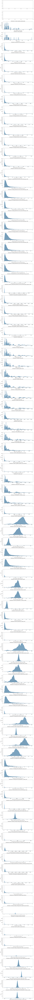

In [ ]:
fig, axes = plt.subplots(nrows=len(df_clean.columns), figsize=(10, 3*len(df_clean.columns)))
for i, col in enumerate(df_clean.columns):
    if pd.api.types.is_numeric_dtype(df_clean[col]):
        sns.histplot(df_clean[col], kde=True, ax=axes[i])
        axes[i].set_title(f'Distribution of {col}')
plt.tight_layout()
plt.show()

In [ ]:
skewness = df_clean.select_dtypes(include=['float64', 'int64']).skew()
print(skewness)

number_hospitals_reporting_today                                     2.484670
total_hospitals                                                      2.546261
admissions_all_covid_confirmed                                       5.026948
admissions_70_covid_confirmed                                        4.537289
admissions_30_49_covid_confirmed                                     6.111667
                                                                       ...   
absolute_change_average_percent_staff_icu_beds_influenza             0.991943
absolute_change_average_percent_adult_inpatient_beds_occupied        0.213272
absolute_change_average_percent_pediatric_inpatient_beds_occupied   -2.696473
absolute_change_average_percent_staff_adult_icu_beds_occupied       -0.040163
absolute_change_average_percent_staff_pediatric_icu_beds_occupied    0.479863
Length: 93, dtype: float64


In [ ]:
def interpret_skewness(df_clean):
    numeric_df = df_clean.select_dtypes(include=['float64', 'int64'])
    skew_values = numeric_df.skew()

    skew_interpretation = {}
    for col, skew_val in skew_values.items():
        if abs(skew_val) < 0.5:
            interpretation = "Approximately symmetric"
        elif abs(skew_val) < 1:
            direction = "right" if skew_val > 0 else "left"
            interpretation = f"Moderately {direction}-skewed"
        else:
            direction = "right" if skew_val > 0 else "left"
            interpretation = f"Highly {direction}-skewed"

        skew_interpretation[col] = {
            'skewness': skew_val,
            'interpretation': interpretation
        }

    return pd.DataFrame.from_dict(skew_interpretation, orient='index')

skew_results = interpret_skewness(df_clean)
print(skew_results)

                                                    skewness  \
number_hospitals_reporting_today                    2.484670   
total_hospitals                                     2.546261   
admissions_all_covid_confirmed                      5.026948   
admissions_70_covid_confirmed                       4.537289   
admissions_30_49_covid_confirmed                    6.111667   
...                                                      ...   
absolute_change_average_percent_staff_icu_beds_...  0.991943   
absolute_change_average_percent_adult_inpatient...  0.213272   
absolute_change_average_percent_pediatric_inpat... -2.696473   
absolute_change_average_percent_staff_adult_icu... -0.040163   
absolute_change_average_percent_staff_pediatric...  0.479863   

                                                             interpretation  
number_hospitals_reporting_today                        Highly right-skewed  
total_hospitals                                         Highly right-skewed

Most of the columns seem to be highly skewd to the right, therefore, **Median** imputation provides a measure of central tendency that is robust to outliers and better represents the "typical" value in skewed distributions. The **median** will be closer to where most of the data points actually cluster (in the lower range of your distribution).
For the slightly symetrical columns we shall use the **mean** to impute the columns.

In [ ]:
from sklearn.impute import SimpleImputer
# Identifying columns for different imputation strategies based on skewness
numeric_cols = df_clean.select_dtypes(include=['float64', 'int64']).columns
skewness = df_clean[numeric_cols].skew()

high_skew_cols = skewness[skewness > 1].index.tolist()
low_skew_cols = skewness[abs(skewness) < 0.5].index.tolist()
median_imputer = SimpleImputer(strategy='median')
mean_imputer = SimpleImputer(strategy='mean')

if high_skew_cols:
    df_clean[high_skew_cols] = median_imputer.fit_transform(df_clean[high_skew_cols])
    print(f"Applied median imputation to {len(high_skew_cols)} skewed columns")

if low_skew_cols:
    df_clean[low_skew_cols] = mean_imputer.fit_transform(df_clean[low_skew_cols])
    print(f"Applied mean imputation to {len(low_skew_cols)} symmetric columns")

missing_after = df_clean[numeric_cols].isna().sum()
print("Missing values after imputation:")
print(missing_after)

Applied median imputation to 73 skewed columns
Applied mean imputation to 6 symmetric columns
Missing values after imputation:
number_hospitals_reporting_today                                        0
total_hospitals                                                         0
admissions_all_covid_confirmed                                          0
admissions_70_covid_confirmed                                           0
admissions_30_49_covid_confirmed                                        0
                                                                     ... 
absolute_change_average_percent_staff_icu_beds_influenza                1
absolute_change_average_percent_adult_inpatient_beds_occupied           0
absolute_change_average_percent_pediatric_inpatient_beds_occupied    3178
absolute_change_average_percent_staff_adult_icu_beds_occupied           0
absolute_change_average_percent_staff_pediatric_icu_beds_occupied       0
Length: 93, dtype: int64


In [ ]:
# Calculate correlation only on numeric columns
all_cols = admissions_df.columns.intersection(df_clean.columns).tolist()
numeric_cols_before = admissions_df[all_cols].select_dtypes(include=['float64', 'int64']).columns
corr_before = admissions_df[numeric_cols_before].dropna().corr()

numeric_cols_after = df_clean[all_cols].select_dtypes(include=['float64', 'int64']).columns
# Calculate the correlation matrix after imputation
corr_after = df_clean[numeric_cols_after].corr()
corr_diff = corr_after - corr_before

Time Series Visualization of the Data set

In [ ]:
df_clean['collection_date'] = pd.to_datetime(df_clean['collection_date'], dayfirst=True)


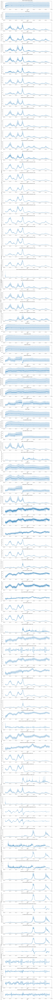

In [ ]:
df_clean['collection_date'] = pd.to_datetime(df_clean['collection_date'])
numeric_cols = df_clean.select_dtypes(include=['number']).columns.tolist()
numeric_cols = [c for c in numeric_cols if c != 'collection_date']

plt.figure(figsize=(15, len(numeric_cols) * 3))

for i, col in enumerate(numeric_cols, start=1):
    ax = plt.subplot(len(numeric_cols), 1, i)
    sns.lineplot(data=df_clean, x='collection_date', y=col, ax=ax)
    ax.set_title(col.replace('_', ' ').title())
    ax.set_xlabel('Date')
    ax.set_ylabel(col.replace('_', ' ').title())
    ax.grid(alpha=0.3)

plt.tight_layout()
plt.show()


In [ ]:
# Define a list of state abbreviations to keep
state_abbreviations_to_keep = ['AZ', 'AK', 'DC', 'KY', 'LA', 'MI', 'MN', 'NH', 'NJ', 'NV', 'OR',
                               'RI', 'SC', 'VA', 'WY', 'HI', 'UT', 'AR', 'NM', 'CO', 'FL', 'GA',
                               'KS', 'MA', 'OK', 'TX', 'WV', 'AL', 'IA', 'IN', 'MS', 'ND', 'NE',
                               'NY', 'OH', 'PA', 'SD', 'TN', 'WA', 'CA', 'CT', 'DE', 'ID', 'IL',
                               'MD', 'ME', 'MO', 'MT', 'NC', 'VT', 'WI']

# Use the boolean Series generated by isin() to index the DataFrame
df_states_only = df_clean[df_clean['jurisdiction'].isin(state_abbreviations_to_keep)].copy()

# Verify the result
print("Shape of DataFrame with only states:", df_states_only.shape)
print("\nUnique jurisdictions in the states-only DataFrame:")
print(df_states_only['jurisdiction'].unique())

Shape of DataFrame with only states: (40030, 95)

Unique jurisdictions in the states-only DataFrame:
['AZ' 'AK' 'DC' 'KY' 'LA' 'MI' 'MN' 'NH' 'NJ' 'NV' 'OR' 'RI' 'SC' 'VA'
 'WY' 'HI' 'UT' 'AR' 'NM' 'CO' 'FL' 'GA' 'KS' 'MA' 'OK' 'TX' 'WV' 'AL'
 'IA' 'IN' 'MS']


In [ ]:
#rename the column to states

df_states_only = df_states_only.rename(columns={'jurisdiction': 'states'})

In [ ]:
df_states_only['collection_date'] = pd.to_datetime(df_states_only['collection_date'], dayfirst=True)


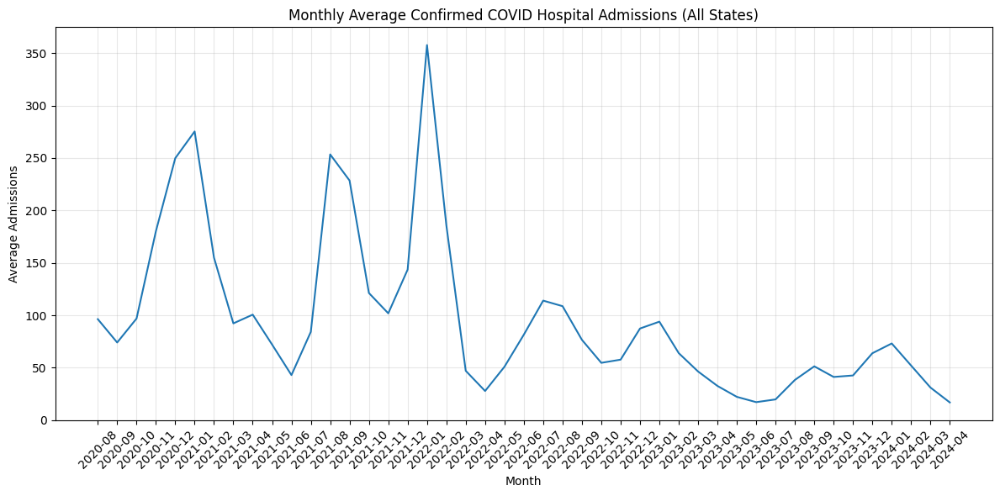

In [ ]:
# Aggregate data by month
df_states_only['year_month'] = df_states_only['collection_date'].dt.to_period('M')
monthly_avg_admissions = df_states_only.groupby('year_month')['average_admissions_all_covid_confirmed'].mean().reset_index()
monthly_avg_admissions['year_month'] = monthly_avg_admissions['year_month'].astype(str)

# Visualize the monthly averages
plt.figure(figsize=(12, 6))
sns.lineplot(data=monthly_avg_admissions, x='year_month', y='average_admissions_all_covid_confirmed')
plt.title('Monthly Average Confirmed COVID Hospital Admissions (All States)')
plt.xlabel('Month')
plt.ylabel('Average Admissions')
plt.xticks(rotation=45)
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

Key insights:
- Admissions peaked sharply around December 2020, January 2021, and January 2022, with January 2022 showing the highest recorded levels.
- After mid-2022, the trend reveals a steady decline, indicating improved pandemic control, vaccinations, or other mitigating factors.
- The later months of 2023 and early 2024 show low and stable admissions, suggesting a shift towards post-pandemic hospital occupancy norms.


In [ ]:
print(df_states_only.columns)


Index(['states', 'collection_date', 'number_hospitals_reporting_today',
       'total_hospitals', 'admissions_all_covid_confirmed',
       'admissions_70_covid_confirmed', 'admissions_30_49_covid_confirmed',
       'admissions_50_69_covid_confirmed', 'admissions_18_29_covid_confirmed',
       'average_admissions_all_covid_confirmed',
       'average_admissions_18_29_covid_confirmed',
       'average_admissions_40_49_covid_confirmed',
       'average_admissions_60_69_covid_confirmed',
       'average_admissions_30_49_covid_confirmed',
       'average_admissions_50_69_covid_confirmed',
       'average_admissions_70_covid_confirmed',
       'admissions_60_69_covid_confirmed',
       'average_admissions_60_69_covid_confirmed_per_100k',
       'average_admissions_50_59_covid_confirmed_per_100k',
       'average_admissions_all_covid_confirmed_per_100k',
       'average_admissions_30_39_covid_confirmed_per_100k',
       'average_admissions_40_49_covid_confirmed_per_100k',
       'average_admi

In [ ]:
df_states_only['percent_inpatient_beds_influenza']

,percent_inpatient_beds_influenza
0,0.000000
1,0.000000
2,0.000000
3,0.000000
4,0.000000
...,...
50254,0.049170
50255,0.074860
50256,0.087631
50257,0.062282


Influenza admissions

Top 5 States by total influenza admissions:
states
TX    369471.0
FL    302609.0
MI    136332.0
AZ    132736.0
NJ    110296.0
Name: total_admissions_all_influenza_confirmed_past_7days, dtype: float64

Monthly influenza admissions for the top 5 jurisdictions:
     states    month  total_admissions_all_influenza_confirmed_past_7days
135      AZ  2020-08                                              434.0  
136      AZ  2020-09                                              420.0  
137      AZ  2020-10                                               43.0  
138      AZ  2020-11                                              441.0  
139      AZ  2020-12                                              700.0  
...     ...      ...                                                ...  
1136     TX  2023-12                                            29295.0  
1137     TX  2024-01                                            44660.0  
1138     TX  2024-02                                            29481.0  
1

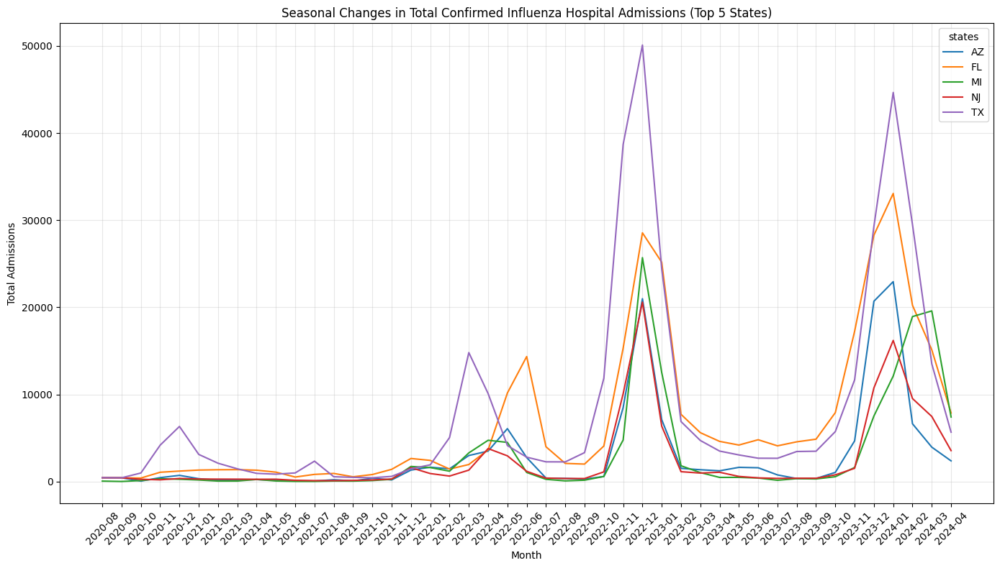

In [ ]:
# Create 'month' column
df_states_only['month'] = df_states_only['collection_date'].dt.to_period('M')

# Group by states and month
monthly_influenza_by_state = df_states_only.groupby(['states', 'month'])[
    'total_admissions_all_influenza_confirmed_past_7days'
].sum().reset_index()

# Calculate total influenza admissions per jurisdiction
total_influenza_by_state = monthly_influenza_by_state.groupby('states')[
    'total_admissions_all_influenza_confirmed_past_7days'
].sum().sort_values(ascending=False)

# Print top 5 states
print("Top 5 States by total influenza admissions:")
print(total_influenza_by_state.head(5))

# Get top 5 jurisdiction names
top_5_states_influenza = total_influenza_by_state.head(5).index.tolist()

# Filter monthly data for the top 5
monthly_influenza_top_5 = monthly_influenza_by_state[
    monthly_influenza_by_state['states'].isin(top_5_states_influenza)
].copy()

# Convert 'month' to string
monthly_influenza_top_5['month'] = monthly_influenza_top_5['month'].astype(str)

# Print the filtered monthly data
print("\nMonthly influenza admissions for the top 5 jurisdictions:")
print(monthly_influenza_top_5)

# Plot
plt.figure(figsize=(14, 8))
sns.lineplot(data=monthly_influenza_top_5,
             x='month',
             y='total_admissions_all_influenza_confirmed_past_7days',
             hue='states')
plt.title('Seasonal Changes in Total Confirmed Influenza Hospital Admissions (Top 5 States)')
plt.xlabel('Month')
plt.ylabel('Total Admissions')
plt.xticks(rotation=45)
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()


The line chart displays seasonal trends in total confirmed influenza hospital admissions from August 2020 to April 2024 across the top 5 U.S. states: AZ (Arizona), FL (Florida), MA (Massachusetts), MI (Michigan), and NJ (New Jersey).

Key Observations:

* Clear seasonal spikes occur roughly between November and February each year, aligning with typical flu seasons.

* Florida (FL) consistently shows the highest number of admissions, with major peaks in December 2022 and January 2024.

* Other states like Michigan (MI) and Arizona (AZ) also show sharp increases during peak flu seasons but at lower levels than Florida.

* A significant rise in admissions is evident in late 2022 and late 2023, suggesting particularly severe flu seasons during those periods.

* Overall, the data highlights strong seasonal patterns and state-level differences in influenza hospital admissions.









Top 5 states with highest average percent pediatric beds occupied:
states
RI    86.054812
DC    77.906557
MN    76.341964
AZ    73.952434
TX    73.867493
Name: average_percent_pediatric_inpatient_beds_occupied, dtype: float64

Monthly data for top 5 jurisdictions:
     states    month  average_percent_pediatric_inpatient_beds_occupied
135      AZ  2020-08                                          63.495683
136      AZ  2020-09                                          64.152861
137      AZ  2020-10                                          59.392910
138      AZ  2020-11                                          59.042640
139      AZ  2020-12                                          58.989001
...     ...      ...                                                ...
1136     TX  2023-12                                          89.464457
1137     TX  2024-01                                          86.616802
1138     TX  2024-02                                          88.056500
1139     TX  20

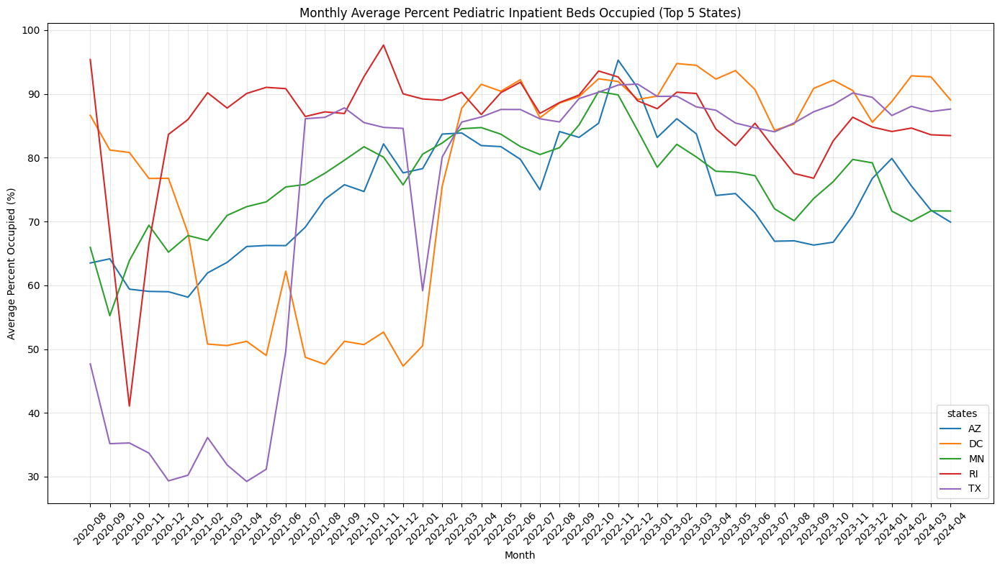

In [ ]:
# Create 'month' column from the collection date
df_states_only['month'] = df_states_only['collection_date'].dt.to_period('M')

# Aggregate data by jurisdiction and month
monthly_pediatric_beds_by_state = df_states_only.groupby(['states', 'month'])[
    'average_percent_pediatric_inpatient_beds_occupied'
].mean().reset_index()

# Get jurisdictions with the highest average percent over the entire period
total_pediatric_beds_by_state = monthly_pediatric_beds_by_state.groupby('states')[
    'average_percent_pediatric_inpatient_beds_occupied'
].mean().sort_values(ascending=False)

# Print the top 5 states
print("Top 5 states with highest average percent pediatric beds occupied:")
print(total_pediatric_beds_by_state.head(5))

# Get list of top 5 states names
top_5_states_pediatric_beds = total_pediatric_beds_by_state.head(5).index.tolist()

# Filter the monthly data for the top 5 states
monthly_pediatric_beds_top_5 = monthly_pediatric_beds_by_state[
    monthly_pediatric_beds_by_state['states'].isin(top_5_states_pediatric_beds)
].copy()

# Convert 'month' to string for plotting
monthly_pediatric_beds_top_5['month'] = monthly_pediatric_beds_top_5['month'].astype(str)

# Print filtered monthly data
print("\nMonthly data for top 5 jurisdictions:")
print(monthly_pediatric_beds_top_5)

# Visualize the trend
plt.figure(figsize=(14, 8))
sns.lineplot(data=monthly_pediatric_beds_top_5,
             x='month',
             y='average_percent_pediatric_inpatient_beds_occupied',
             hue='states')
plt.title('Monthly Average Percent Pediatric Inpatient Beds Occupied (Top 5 States)')
plt.xlabel('Month')
plt.ylabel('Average Percent Occupied (%)')
plt.xticks(rotation=45)
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()


This graph illustrates the monthly average percentage of pediatric inpatient beds occupied in the top five U.S. states between August 2020 and April 2024.

Key insights:
- North Dakota (ND) experienced extreme fluctuations, with notable spikes in October 2020, December 2020, and November 2021—reaching occupancy rates far beyond 100%.
- Other states—DC, Minnesota (MN), Nebraska (NE), and Rhode Island (RI)—maintained relatively stable and lower occupancy rates, generally staying below 100% throughout the observed period.
- The data suggests North Dakota faced severe surges in demand for pediatric inpatient care, while the other states experienced more consistent, manageable occupancy rates.


Adult Inpatient Bed Occupancy Trends (Top 5 States)

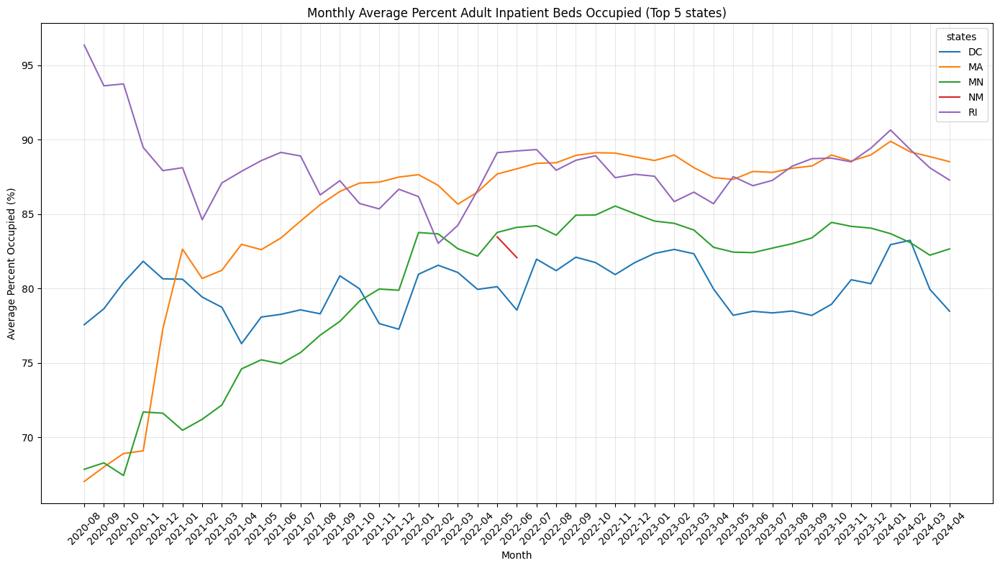

In [ ]:
# Group by states and month for adult inpatient beds
monthly_adult_beds_by_state = df_states_only.groupby(['states', 'month'])[
    'average_percent_adult_inpatient_beds_occupied'
].mean().reset_index()

# Get top 5 states by average occupancy
top_5_adult = monthly_adult_beds_by_state.groupby('states')[
    'average_percent_adult_inpatient_beds_occupied'
].mean().sort_values(ascending=False).head(5).index.tolist()

# Filter data
monthly_adult_top_5 = monthly_adult_beds_by_state[
    monthly_adult_beds_by_state['states'].isin(top_5_adult)
].copy()
monthly_adult_top_5['month'] = monthly_adult_top_5['month'].astype(str)

# Plot
plt.figure(figsize=(14, 8))
sns.lineplot(data=monthly_adult_top_5,
             x='month',
             y='average_percent_adult_inpatient_beds_occupied',
             hue='states')
plt.title('Monthly Average Percent Adult Inpatient Beds Occupied (Top 5 states)')
plt.xlabel('Month')
plt.ylabel('Average Percent Occupied (%)')
plt.xticks(rotation=45)
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()


ICU Influenza Confirmed Patients Over Time

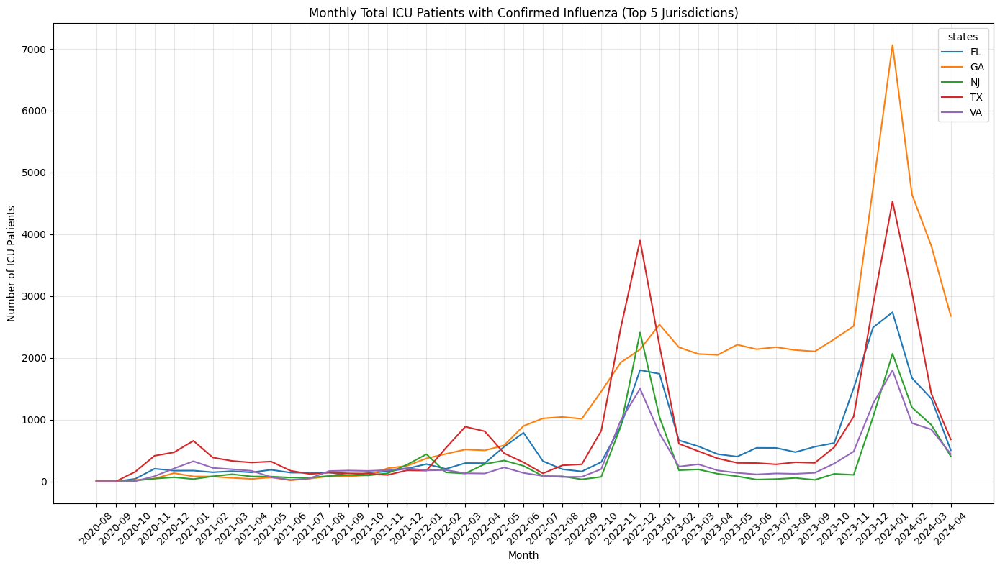

In [ ]:
# Group and summarize ICU influenza data
monthly_icu_influenza = df_states_only.groupby(['states', 'month'])[
    'icu_patients_influenza_confirmed'
].sum().reset_index()

# Top 5 states by total ICU influenza cases
top_5_icu = monthly_icu_influenza.groupby('states')[
    'icu_patients_influenza_confirmed'
].sum().sort_values(ascending=False).head(5).index.tolist()

# Filter and plot
icu_top_5 = monthly_icu_influenza[monthly_icu_influenza['states'].isin(top_5_icu)].copy()
icu_top_5['month'] = icu_top_5['month'].astype(str)

plt.figure(figsize=(14, 8))
sns.lineplot(data=icu_top_5,
             x='month',
             y='icu_patients_influenza_confirmed',
             hue='states')
plt.title('Monthly Total ICU Patients with Confirmed Influenza (Top 5 Jurisdictions)')
plt.xlabel('Month')
plt.ylabel('Number of ICU Patients')
plt.xticks(rotation=45)
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()


Compare COVID vs. Influenza Admissions

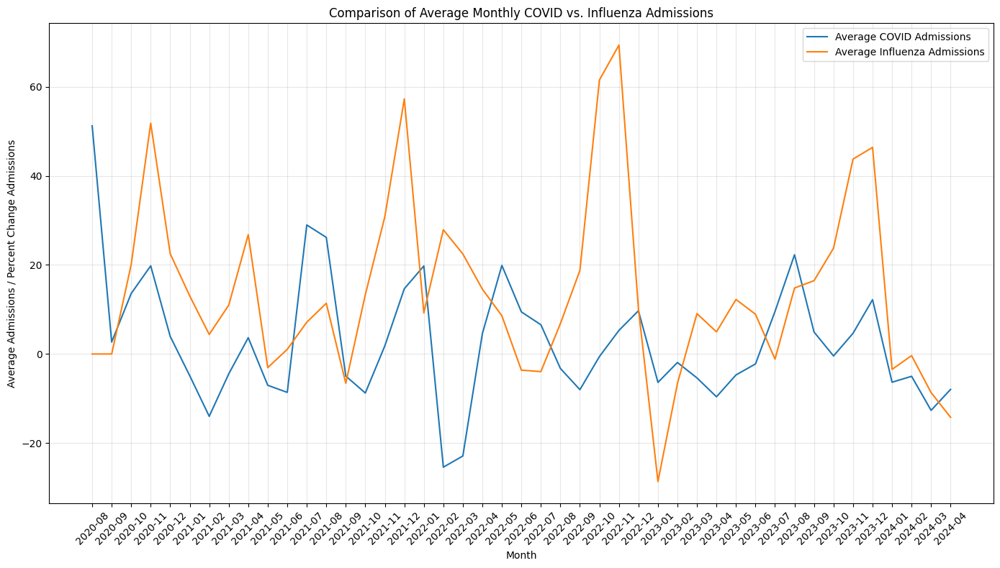

In [ ]:
# Select the relevant columns for comparison
covid_admissions = df_states_only.groupby('month')['percent_change_total_admissions_all_covid_confirmed_past_7days'].mean().reset_index()
influenza_admissions = df_states_only.groupby('month')['percent_change_total_admissions_all_influenza_confirmed_past_7days'].mean().reset_index()

# Convert 'month' to datetime for proper plotting
covid_admissions['month'] = covid_admissions['month'].astype(str)
influenza_admissions['month'] = influenza_admissions['month'].astype(str)

# Merge the two dataframes for plotting
merged_admissions = pd.merge(covid_admissions, influenza_admissions, on='month')

plt.figure(figsize=(14, 8))

sns.lineplot(data=merged_admissions, x='month', y= 'percent_change_total_admissions_all_covid_confirmed_past_7days', label='Average COVID Admissions')
sns.lineplot(data=merged_admissions, x='month', y='percent_change_total_admissions_all_influenza_confirmed_past_7days', label='Average Influenza Admissions')

plt.title('Comparison of Average Monthly COVID vs. Influenza Admissions')
plt.xlabel('Month')
plt.ylabel('Average Admissions / Percent Change Admissions')
plt.xticks(rotation=45)
plt.legend()
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

Hospital Admissions by Jurisdiction (Top 10)



<ipython-input-96-ed382ada7251>:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=top_jurisdictions.values, y=top_jurisdictions.index, palette="viridis")


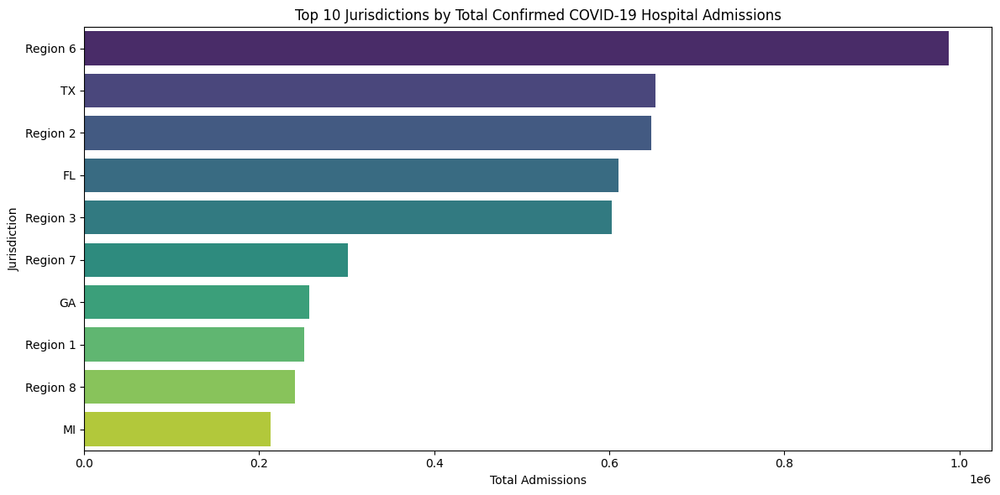

In [ ]:
# Group by jurisdiction and sum admissions
top_jurisdictions = df_clean.groupby('jurisdiction')['admissions_all_covid_confirmed'].sum().sort_values(ascending=False).head(10)

# Plot
plt.figure(figsize=(12, 6))
sns.barplot(x=top_jurisdictions.values, y=top_jurisdictions.index, palette="viridis")
plt.title("Top 10 Jurisdictions by Total Confirmed COVID-19 Hospital Admissions")
plt.xlabel("Total Admissions")
plt.ylabel("Jurisdiction")
plt.tight_layout()
plt.show()
